In [1]:
from src.visualise import settings
from src.visualise.plot import plot_data, plot_data_simple
from src.data.analysis import read_tiff_img, Circle, create_circular_mask
from src.data.detector import find_circle_hough_method, img_for_circle_detection

import numpy as np
import matplotlib.pyplot as plt
import re

from dataclasses import dataclass, field
from pathlib import Path

from copy import deepcopy

# Data structures

In [2]:
@dataclass(frozen=True)
class DetectorImage:
    image: np.ndarray
    path: Path

    @property
    def init_circle(self) -> Circle:
        return Circle(x=self.image.shape[0]//2, y=self.image.shape[1]//2, r=100)

@dataclass(frozen=True)
class DetectorData:
    raw: DetectorImage
    lv: DetectorImage
    det_no: int
    circle: Circle = field(default=Circle())

@dataclass(frozen=True)
class DetectorDataCollection:
    path: Path
    data: dict[int, DetectorData] = field(default_factory=dict)

    def __post_init__(self):
        if not self.data:
            self._load_data()

    def _load_data(self):
        for file_path in sorted(self.path.iterdir()):
            if file_path.name.endswith('lv'):
                # get detector data
                det_id = re.findall(r'\d+', file_path.name)[0]
                det_no = int(det_id)
                # live view images
                lv_path = next(file_path.glob('**/*tif'))
                lv_data = read_tiff_img(lv_path, border_px=0)
                lv_image = DetectorImage(image=lv_data, path=lv_path)
                # raw data images
                try:
                    raw_path = next((self.path / det_id).glob('**/*tif'))
                    raw_data = read_tiff_img(raw_path, border_px=0)
                    raw_image = DetectorImage(image=raw_data, path=raw_path)
                    det_data = DetectorData(raw=raw_image, lv=lv_image, det_no=det_no)
                    self.data[det_no] = det_data
                    print(f"{det_no} ", end='')
                except StopIteration:
                    print(f"missing_{det_no} ", end='')

In [3]:
base_path = Path.home() / 'OneDrive - ifj.edu.pl' / 'Projects' / 'MB_foils'
base_path.exists()

True

In [4]:
raw_path = base_path / '2024-04-22_PB_with_EBT_4Gy' / '2024-04-22_PB_4Gy'
proton_raw_data = DetectorDataCollection(path=raw_path)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 

In [5]:
co60_path = base_path / '2024-04-22_PB_with_EBT_4Gy' / '2024-04-26_Co60_4Gy'
co60_raw_data = DetectorDataCollection(path=co60_path)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 

In [6]:
bg_path = base_path / '2024-04-22_PB_with_EBT_4Gy' / '2024-04-25_tlo'
bg_raw_data = DetectorDataCollection(path=bg_path)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 

## Output paths

In [7]:
base_output_path = base_path / '2024-04-22_PB_with_EBT_4Gy' /  'data' / 'interim'
proton_output_path = base_output_path / 'PB_4Gy'
co60_output_path = base_output_path / 'Co60'
bg_output_path = base_output_path / 'tlo'

# remove base output path
import shutil
shutil.rmtree(base_output_path, ignore_errors=True)

# create output paths
proton_output_path.mkdir(parents=True)
co60_output_path.mkdir(parents=True)
bg_output_path.mkdir(parents=True)

# Proton raw data

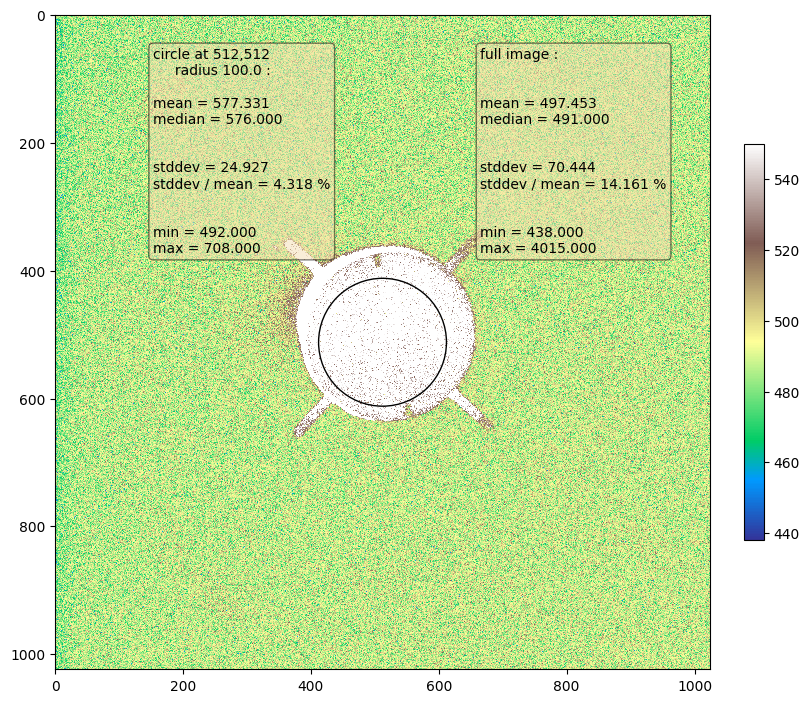

In [8]:
det_id = 2
fig, ax = plot_data_simple(proton_raw_data.data[det_id].lv.image, circle_px=proton_raw_data.data[det_id].lv.init_circle)

# Co60 raw data

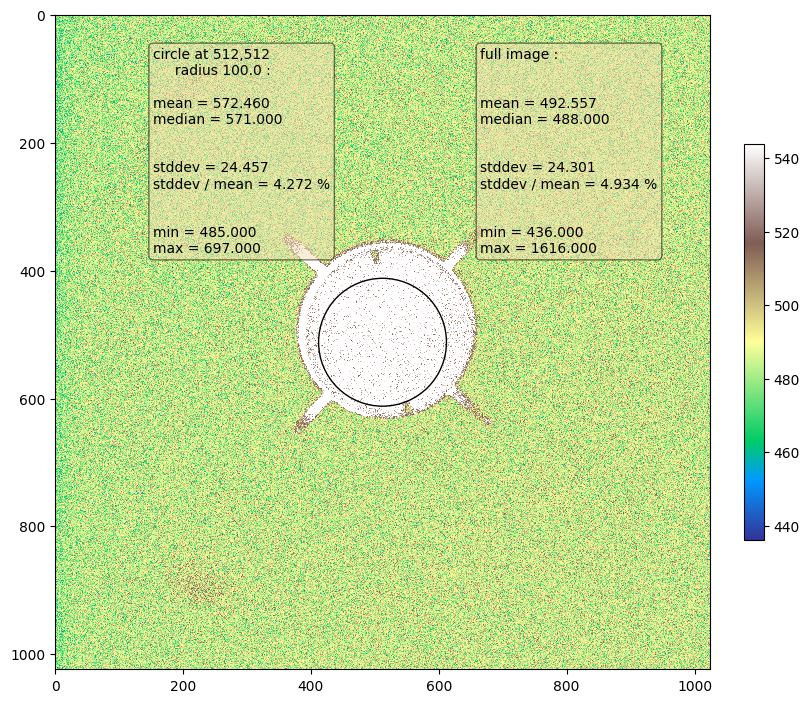

In [9]:
fig, ax = plot_data(co60_raw_data.data[2].lv.image, circle_px=co60_raw_data.data[2].lv.init_circle)

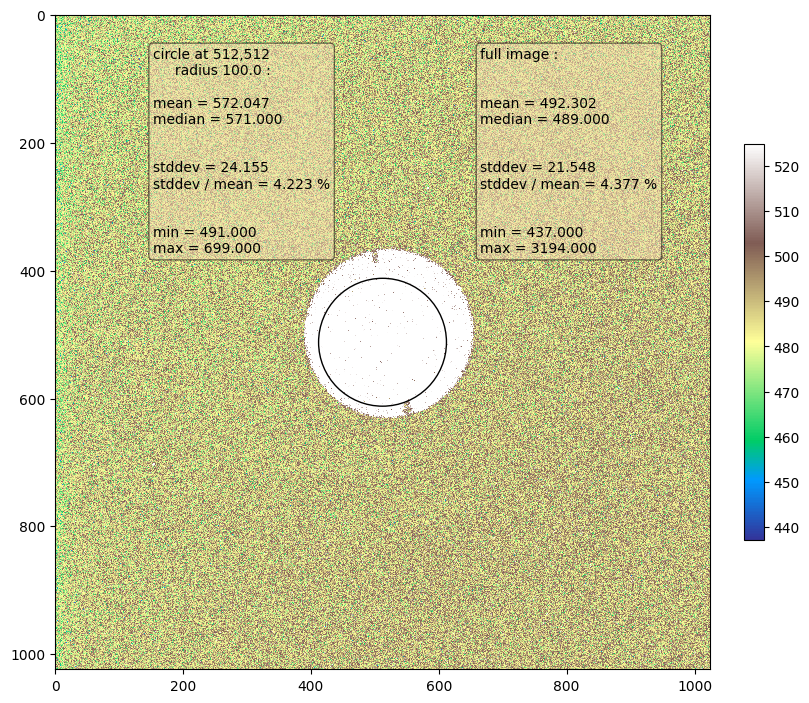

In [10]:
fig, ax = plot_data_simple(co60_raw_data.data[2].raw.image, circle_px=co60_raw_data.data[2].raw.init_circle)

## Background

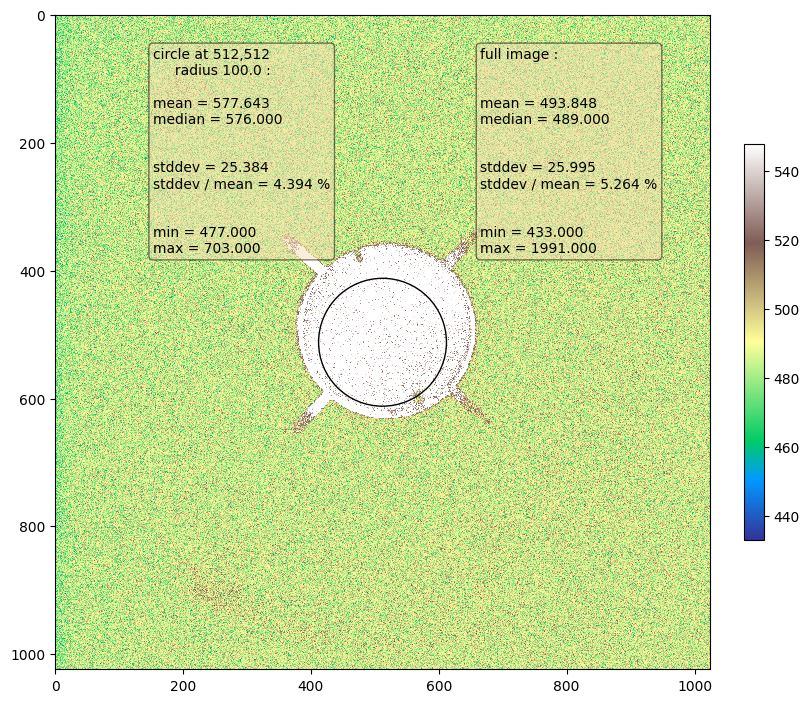

In [11]:
fig, ax = plot_data(bg_raw_data.data[2].lv.image, circle_px=bg_raw_data.data[2].lv.init_circle)

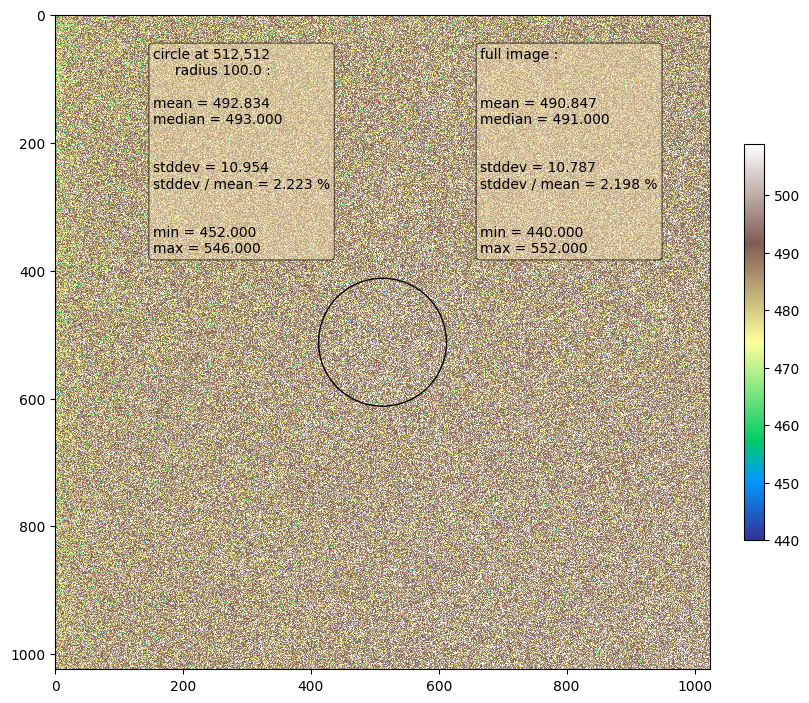

In [12]:
fig, ax = plot_data(bg_raw_data.data[2].raw.image, circle_px=bg_raw_data.data[2].raw.init_circle)

In [13]:
# background_path = next((project_dir / 'data' / 'raw' / '2024-02-20').parent.glob('**/*background*/**/**/*tif'))
# background_data = DetectorImage(path=background_path, image=read_tiff_img(background_path, border_px=0))
background_data = bg_raw_data.data[2].raw

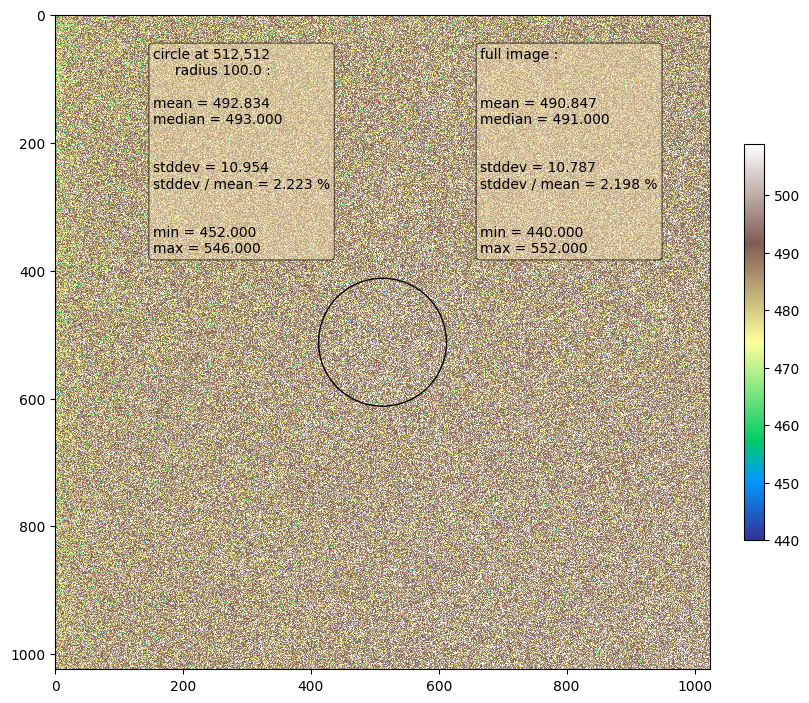

In [14]:
fig, ax = plot_data(background_data.image, circle_px=background_data.init_circle)

# Save plots

## Save raw data without detector

In [15]:
for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path, bg_output_path],
    [proton_raw_data, co60_raw_data, bg_raw_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'raw_data'
    plot_path.mkdir(parents=True, exist_ok=True)

    # get vmax from 90% centile of all images in the circle
    vmax_list = []
    for data in dataset.data.values():
        mask = create_circular_mask(data.raw.image, data.raw.init_circle)
        percentile = np.nanpercentile(a=data.raw.image[mask], q=90)
        vmax_list.append(percentile)
    vmax = max(vmax_list)

    concatenated_flattened_data = np.concatenate([data.raw.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_data, q=3)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'raw_data_det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        fig, ax = plot_data_simple(data.raw.image, circle_px=data.raw.init_circle, vmin=vmin, vmax=vmax, clip=False)
        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        plt.close(fig)

vmin: 468.0, vmax: 772.0
vmin: 468.0, vmax: 615.0
vmin: 468.0, vmax: 507.0


# Background subtraction

In [16]:
proton_bg_sub_data = DetectorDataCollection(path=proton_raw_data.path, data=deepcopy(proton_raw_data.data))
for data in proton_bg_sub_data.data.values():
    # out data are save as uint16, dataclasses are frozen
    # its not straightforward to use np.crop(0) or cast to int64
    # therefore we shift data up, perform background subtraction, crop negative values and shift back
    np.add(data.raw.image, background_data.image.max(), out=data.raw.image)    
    np.subtract(data.raw.image, background_data.image, out=data.raw.image)
    np.clip(data.raw.image, a_min=background_data.image.max(), a_max=None, out=data.raw.image)
    np.subtract(data.raw.image, background_data.image.max(), out=data.raw.image)


In [17]:
co60_bg_sub_data = DetectorDataCollection(path=co60_raw_data.path, data=deepcopy(co60_raw_data.data))
for data in co60_bg_sub_data.data.values():

    # out data are save as uint16, dataclasses are frozen
    # its not straightforward to use np.crop(0) or cast to int64
    # therefore we shift data up, perform background subtraction, crop negative values and shift back
    np.add(data.raw.image, background_data.image.max(), out=data.raw.image)    
    np.subtract(data.raw.image, background_data.image, out=data.raw.image)
    np.clip(data.raw.image, a_min=background_data.image.max(), a_max=None, out=data.raw.image)
    np.subtract(data.raw.image, background_data.image.max(), out=data.raw.image)

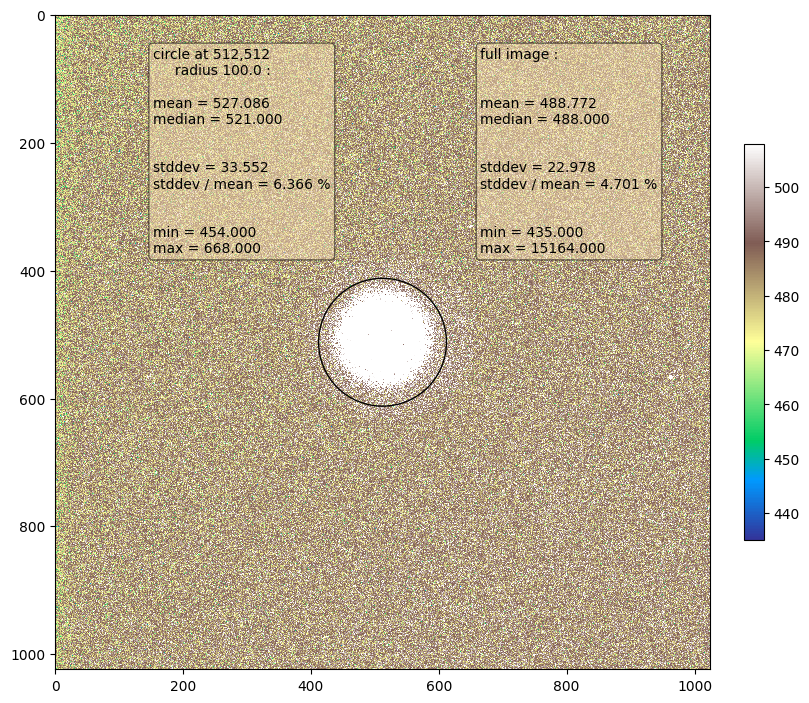

In [18]:
fig, ax = plot_data_simple(proton_raw_data.data[2].raw.image, circle_px=proton_raw_data.data[2].raw.init_circle)

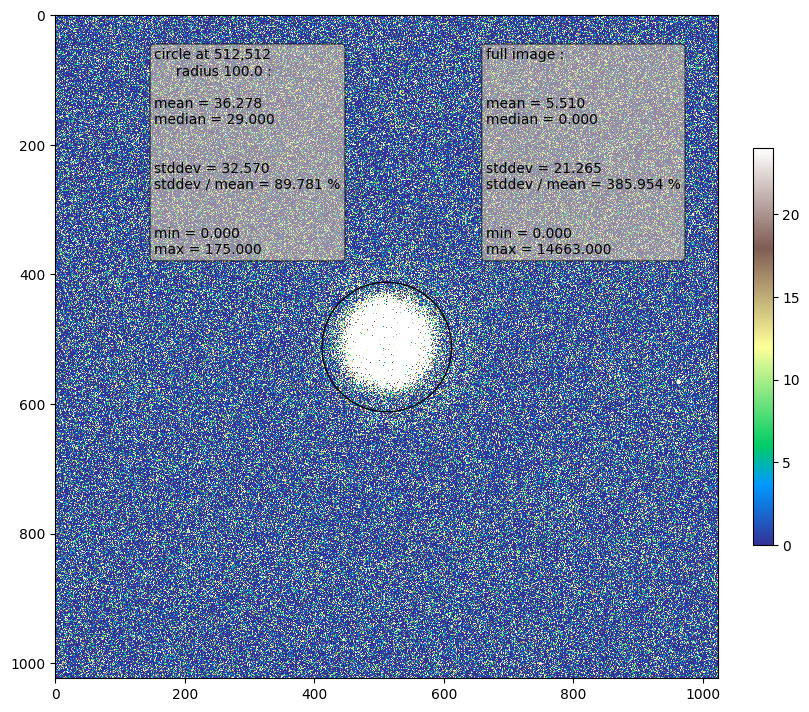

In [19]:
fig, ax = plot_data(proton_bg_sub_data.data[2].raw.image, circle_px=proton_bg_sub_data.data[2].raw.init_circle)

# Detector discovery

In [20]:
det_data_dict = {}
for data in proton_bg_sub_data.data.values():
    lv_for_detect = img_for_circle_detection(data.lv.image)
    circle = find_circle_hough_method(lv_for_detect)
    det_data = DetectorData(raw=data.raw, lv=data.lv, det_no=data.det_no, circle=circle)
    det_data_dict[data.det_no] = det_data
    print(f"{data.det_no} ", end='')
proton_det_data = DetectorDataCollection(path=proton_raw_data.path, data=det_data_dict)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 

In [21]:
det_data_dict = {}
for data in co60_bg_sub_data.data.values():
    lv_for_detect = img_for_circle_detection(data.lv.image)
    circle = find_circle_hough_method(lv_for_detect)
    det_data = DetectorData(raw=data.raw, lv=data.lv, det_no=data.det_no, circle=circle)
    det_data_dict[data.det_no] = det_data
    print(f"{data.det_no} ", end='')
co60_det_data = DetectorDataCollection(path=co60_raw_data.path, data=det_data_dict)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 

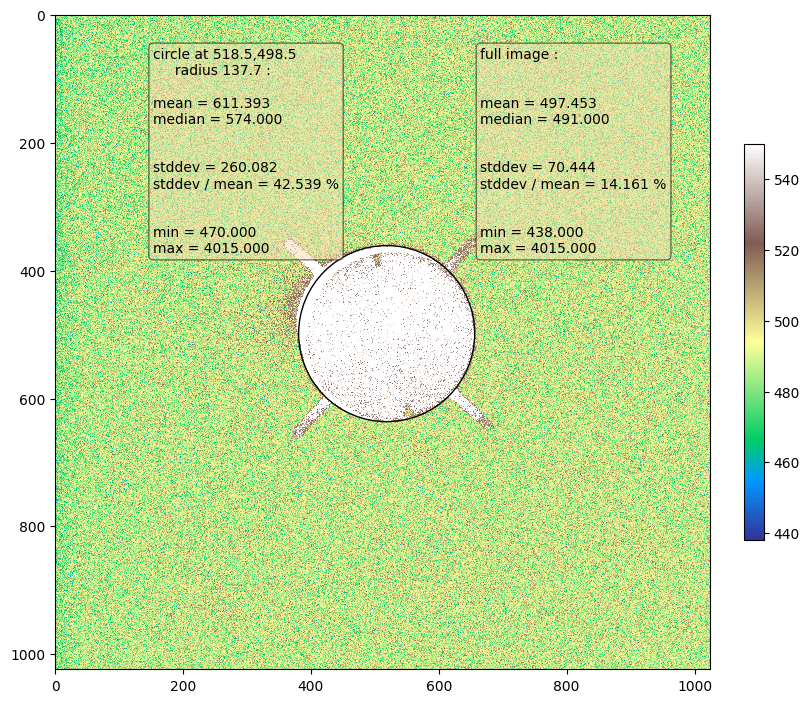

In [22]:
detid = 2 
fig, ax = plot_data(proton_det_data.data[detid].lv.image, circle_px=proton_det_data.data[detid].circle)

In [23]:
mean_radius = np.mean([data.circle.r for data in proton_det_data.data.values()])
mean_radius_mm = 10.0
px_to_mm = mean_radius_mm / mean_radius
px_to_mm

0.07211249531663806

## Save plots with detector

In [24]:
for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path],
    [proton_det_data, co60_det_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'live_view'
    plot_path.mkdir(parents=True, exist_ok=True)

    # set vmin to the 5% centile of all images and vmax to 95% centile
    concatenated_flattened_lv_data = np.concatenate([data.lv.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_lv_data, q=5)
    vmax = np.nanpercentile(a=concatenated_flattened_lv_data, q=95)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'det_lv_det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        fig, ax = plot_data_simple(data.lv.image, circle_px=data.circle, vmin=vmin, vmax=vmax, clip=False)
        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        plt.close(fig)

vmin: 470.0, vmax: 546.0
vmin: 470.0, vmax: 543.0


In [25]:
for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path],
    [proton_det_data, co60_det_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'bg_sub_data'
    plot_path.mkdir(parents=True, exist_ok=True)

    # get vmax from 90% centile of all images in the circle
    vmax_list = []
    for data in dataset.data.values():
        mask = create_circular_mask(data.raw.image, data.raw.init_circle)
        percentile = np.nanpercentile(a=data.raw.image[mask], q=90)
        vmax_list.append(percentile)
    vmax = max(vmax_list)

    concatenated_flattened_data = np.concatenate([data.raw.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_data, q=3)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'bg_sub_data_det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        fig, ax = plot_data_simple(data.raw.image, circle_px=data.circle, vmin=vmin, vmax=vmax, clip=False)
        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        plt.close(fig)

vmin: 0.0, vmax: 281.0
vmin: 0.0, vmax: 124.0


## Detector cutting

In [26]:
min_radius_protons = min([data.circle.r for data in proton_det_data.data.values()])
min_radius_co60 = min([data.circle.r for data in co60_det_data.data.values()])
min_radius_all = np.floor(min(min_radius_protons, min_radius_co60)).astype(int)

print(f"min radius - protons: {min_radius_protons:.2f}, Co60: {min_radius_co60:.2f}, all: {min_radius_all}")
print(f"min radius - protons: {min_radius_protons * px_to_mm:.2f} [mm], Co60: {min_radius_co60 * px_to_mm:.2f} [mm], all: {min_radius_all * px_to_mm:.2f} [mm]")

min radius - protons: 128.20, Co60: 130.70, all: 128
min radius - protons: 9.24 [mm], Co60: 9.43 [mm], all: 9.23 [mm]


In [27]:
def cut_detector(det_data: DetectorData, min_radius: int, factor: float = 1.2) -> DetectorData:
    lower_x = np.ceil(det_data.circle.x - factor*min_radius).astype(int)
    upper_x = np.floor(det_data.circle.x + factor*min_radius).astype(int)
    lower_y = np.ceil(det_data.circle.y - factor*min_radius).astype(int)
    upper_y = np.floor(det_data.circle.y + factor*min_radius).astype(int)
    
    new_circle = Circle(x=det_data.circle.x - lower_x, y=det_data.circle.y - lower_y, r=det_data.circle.r)
    cut_raw_image = det_data.raw.image[lower_y:upper_y, lower_x:upper_x][:]
    cut_lv_image = det_data.lv.image[lower_y:upper_y, lower_x:upper_x][:]

    return DetectorData(raw=DetectorImage(image=cut_raw_image, path=det_data.raw.path), lv=DetectorImage(image=cut_lv_image, path=det_data.lv.path), det_no=det_data.det_no, circle=new_circle)

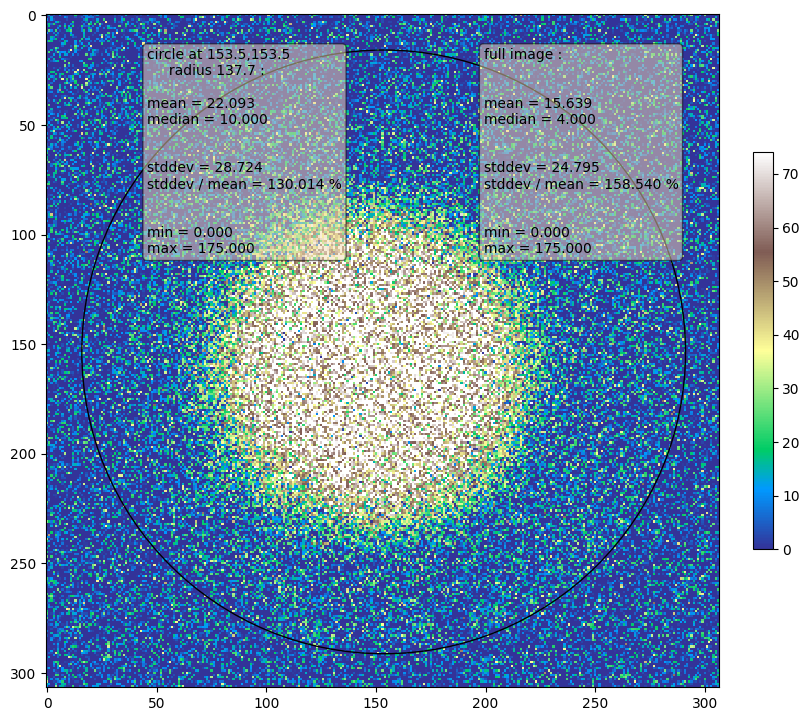

In [28]:
c1 = cut_detector(proton_det_data.data[2], min_radius_all)
fig, ax = plot_data(c1.raw.image, circle_px=c1.circle)
#c1.circle.radius * px_to_mm

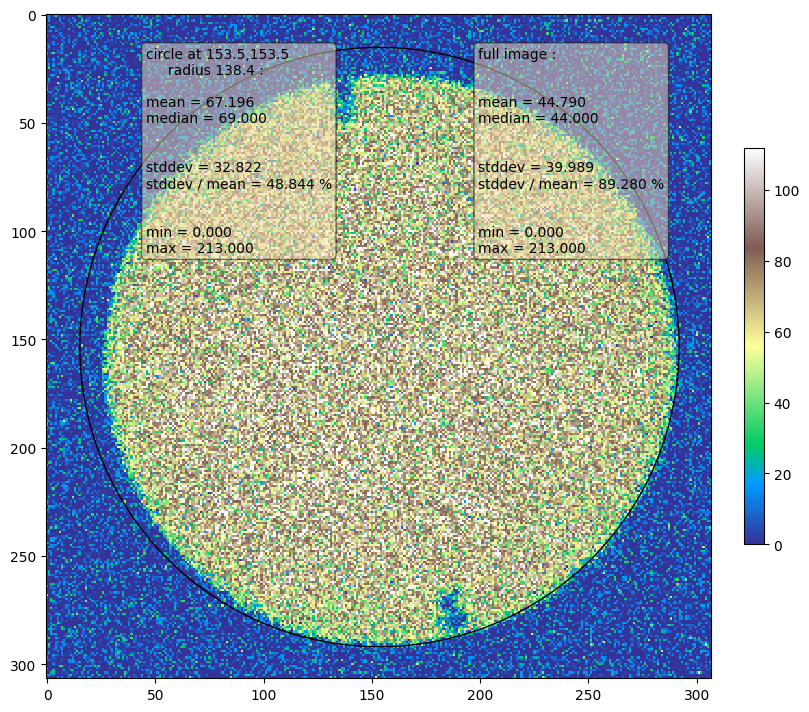

In [29]:
c1 = cut_detector(co60_det_data.data[2], min_radius_all)
fig, ax = plot_data(c1.raw.image, circle_px=c1.circle)

In [30]:
det_data_dict = {}
for data in proton_det_data.data.values():
    det_data_dict[data.det_no] = cut_detector(data, min_radius_all)
    print(f"{data.det_no} ", end='')
proton_det_cut_data = DetectorDataCollection(path=proton_det_data.path, data=det_data_dict)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 

In [31]:
det_data_dict = {}
for data in co60_det_data.data.values():
    det_data_dict[data.det_no] = cut_detector(data, min_radius_all)
    print(f"{data.det_no} ", end='')
co60_det_cut_data = DetectorDataCollection(path=co60_det_data.path, data=det_data_dict)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 

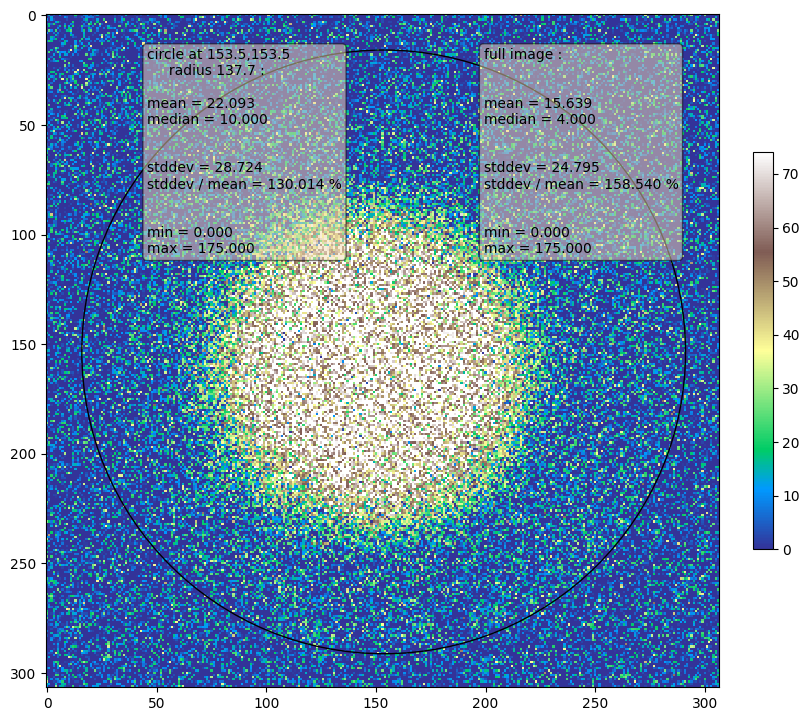

In [32]:
fig, ax = plot_data(proton_det_cut_data.data[2].raw.image, circle_px=proton_det_cut_data.data[2].circle)

# Center of mass

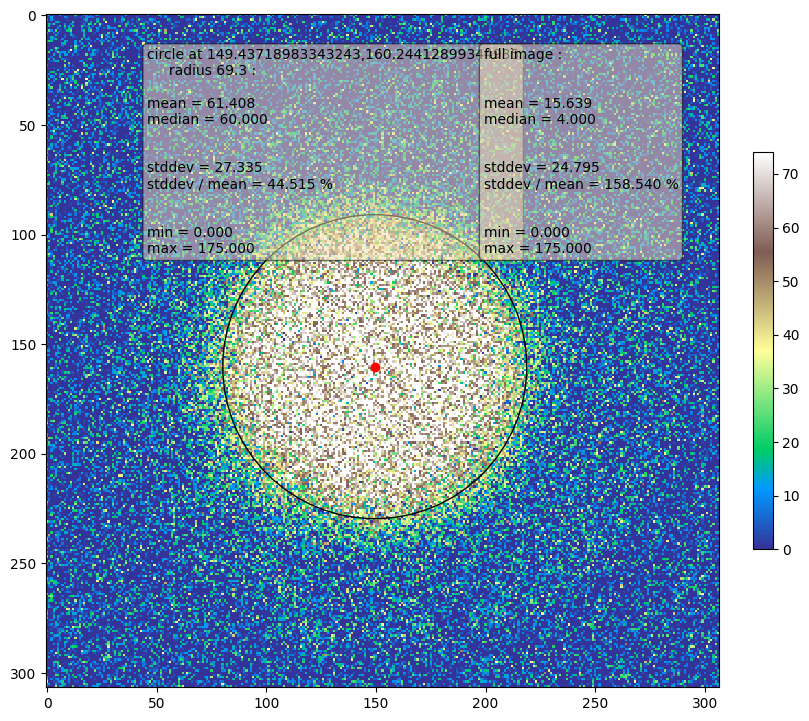

In [33]:
from scipy.ndimage import center_of_mass

r_px = 5 / px_to_mm

def center_of_mass_det(data: DetectorData) -> tuple[float, float]:
    detector_region = deepcopy(data.raw.image)
    circle_smaller_than_det = Circle(x=data.circle.x, y=data.circle.y, r=data.circle.r * 0.95)
    mask_circle = create_circular_mask(img=detector_region, circle_px=circle_smaller_than_det)
    detector_region[~mask_circle] = 0
    cm = center_of_mass(detector_region)
    return cm

det_id = 2
cm1 = center_of_mass_det(proton_det_cut_data.data[det_id])
cm1_circle = Circle(x=cm1[1], y=cm1[0], r=r_px)
fig, ax = plot_data_simple(proton_det_cut_data.data[det_id].raw.image, circle_px=cm1_circle, clip=True)
ax.plot(cm1[1], cm1[0], 'o', color='red')

In [34]:
r_px = 5 / px_to_mm

for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path],
    [proton_det_cut_data, co60_det_cut_data]):

    # save plots from all detectors
    plot_path = plot_output_path / 'bg_sub_data'
    plot_path.mkdir(parents=True, exist_ok=True)

    # get vmax from 90% centile of all images in the circle
    vmax_list = []
    for data in dataset.data.values():
        mask = create_circular_mask(data.raw.image, data.raw.init_circle)
        percentile = np.nanpercentile(a=data.raw.image[mask], q=90)
        vmax_list.append(percentile)
    vmax = max(vmax_list)

    concatenated_flattened_data = np.concatenate([data.raw.image.flatten() for data in dataset.data.values()])
    vmin = np.nanpercentile(a=concatenated_flattened_data, q=3)
    print(f"vmin: {vmin}, vmax: {vmax}")

    for det_no, data in dataset.data.items():
        output_path = plot_path / f'det_cut_bg_sub_data_det{det_no:02d}'
        output_path.unlink(missing_ok=True)
        fig, ax = plot_data_simple(data.raw.image, circle_px=data.circle, vmin=vmin, vmax=vmax, clip=False)

        cm = center_of_mass_det(data)
        cm_circle = Circle(x=cm[1], y=cm[0], r=r_px)
        ax.plot(cm[1], cm[0], 'o', color='red')
        ax.add_artist(
            plt.Circle(xy=(cm_circle.x, cm_circle.y),
                   radius=cm_circle.r,
                   color='red',
                   fill=False,
                   transform=ax.transData))

        ax.set_title(f"Detector {det_no}")
        fig.savefig(output_path)
        plt.close(fig)

vmin: 0.0, vmax: 212.0
vmin: 0.0, vmax: 115.0


In [35]:
# Save numpy data to disk for calculation of profiles

for plot_output_path, dataset in zip(
    [proton_output_path, co60_output_path],
    [proton_det_cut_data, co60_det_cut_data]):
    npy_path = plot_output_path / 'bg_sub_data'
    npy_path.mkdir(parents=True, exist_ok=True)
    for det_no, data in dataset.data.items():
        output_path = npy_path / f'data_det{det_no:02d}'
        np.save(arr=data.raw.image, file=output_path)

# Mean signal inspection

In [36]:
min_radius_all
singal_radius = 0.5 * min_radius_all
singal_radius

64.0

In [37]:
from collections import defaultdict
import pandas as pd
df_data = defaultdict(list)
for data in proton_det_cut_data.data.values():
    #mask = create_circular_mask(img=data.raw.image, circle_px=Circle(x=data.circle.x, y=data.circle.y, r=singal_radius))
    cm = center_of_mass_det(data)
    cm_circle = Circle(x=cm[1], y=cm[0], r=60)
    mask = create_circular_mask(img=data.raw.image, circle_px=cm_circle)
    df_data["det_no"] += [int(data.det_no)]
    df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
    df_data["std_signal"] += [np.std(data.raw.image[mask])]
    df_data["radiation"] += ["proton"]
for data in co60_det_cut_data.data.values():
    mask = create_circular_mask(img=data.raw.image, circle_px=Circle(x=data.circle.x, y=data.circle.y, r=singal_radius))
    df_data["det_no"] += [int(data.det_no)]
    df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
    df_data["std_signal"] += [np.std(data.raw.image[mask])]
    df_data["radiation"] += ["Co60"]
df = pd.DataFrame(df_data)
df.sort_values(by=["radiation","det_no"], inplace=True)
df

,det_no,mean_signal,std_signal,radiation
18,1,80.140320,26.773077,Co60
19,2,80.682749,26.619864,Co60
20,3,81.427474,26.776698,Co60
21,4,81.918787,27.106111,Co60
22,5,80.519780,26.719783,Co60
23,6,77.604639,26.880113,Co60
24,7,78.782035,26.821880,Co60
25,8,67.743019,28.576068,Co60
26,9,80.497983,26.277699,Co60
27,10,74.276916,26.355978,Co60


<Axes: xlabel='det_no'>

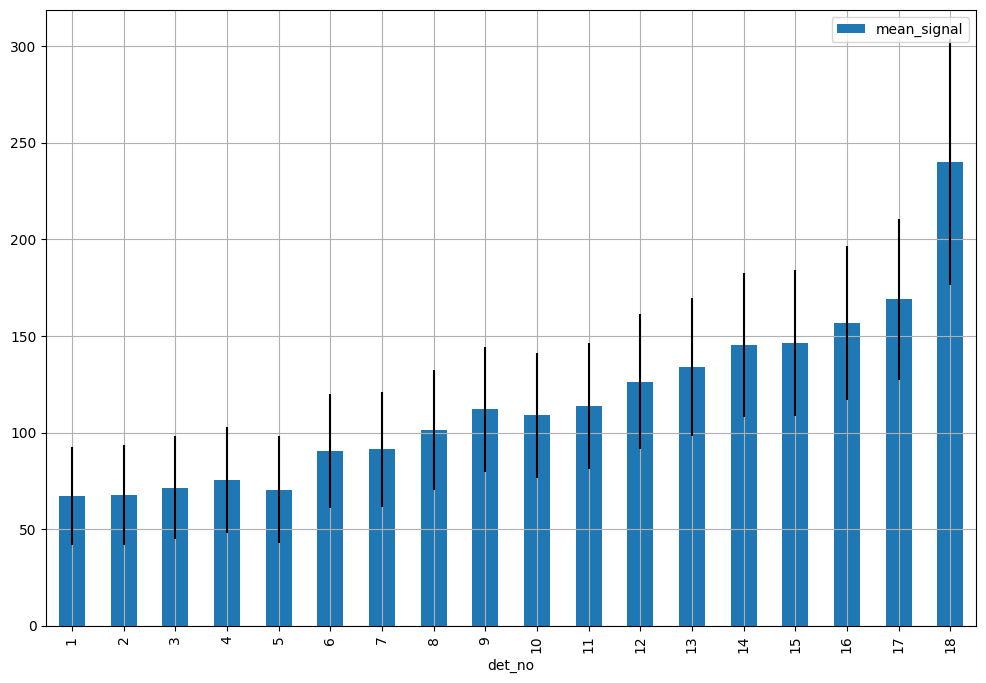

In [38]:
df[df.radiation == 'proton'].plot(x='det_no', y='mean_signal', yerr='std_signal', kind='bar', figsize=(12, 8), grid=True)

<Axes: xlabel='det_no'>

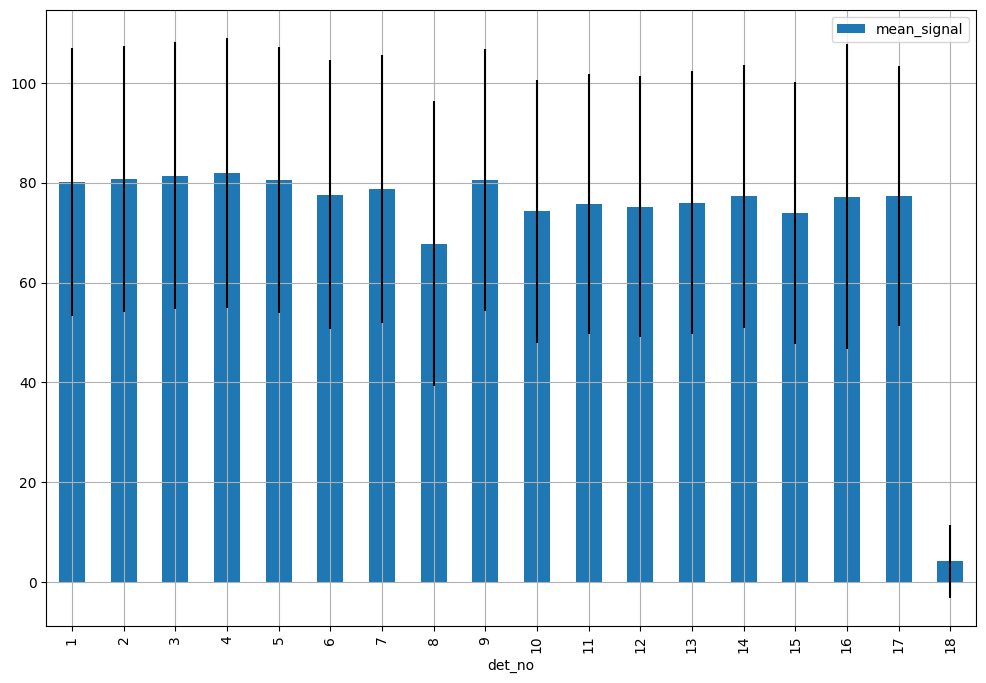

In [39]:
df[df.radiation == 'Co60'].plot(x='det_no', y='mean_signal', yerr='std_signal', kind='bar', figsize=(12, 8), grid=True)

In [40]:
det_data_dict = {}
for data in proton_det_cut_data.data.values():
    if data.det_no <= 17:
        det_data_dict[data.det_no] = data
        print(f"{data.det_no} ", end='')
proton_det_sel_data = DetectorDataCollection(path=proton_det_cut_data.path, data=det_data_dict)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 

In [41]:
det_data_dict = {}
for data in co60_det_cut_data.data.values():
    if data.det_no >= 1 and data.det_no <= 17:
        det_data_dict[data.det_no] = data
        print(f"{data.det_no} ", end='')
co60_det_sel_data = DetectorDataCollection(path=co60_det_cut_data.path, data=det_data_dict)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 

In [42]:
import random
import math
num_circles = 1000
small_radius = 10
shift_x, shift_y = [], []
min_radius_all = 60
for _ in range(num_circles):
    angle = random.uniform(0, 2*np.pi)
    distance = random.uniform(0, 0.8*min_radius_all-small_radius)
    shift_x.append(distance * math.cos(angle))
    shift_y.append(distance * math.sin(angle))

In [43]:
df_data = defaultdict(list)
for data in proton_det_sel_data.data.values():
    for circle_no in range(num_circles):
        circle = Circle(x=data.circle.x + shift_x[circle_no], y=data.circle.y + shift_y[circle_no], r=small_radius)
        mask = create_circular_mask(img=data.raw.image, circle_px=circle)
        df_data["det_no"] += [int(data.det_no)]
        df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
        df_data["std_signal"] += [np.std(data.raw.image[mask])]
        df_data["radiation"] += ["proton"]
        df_data["circle_no"] += [circle_no]
for data in co60_det_sel_data.data.values():
    for circle_no in range(num_circles):
        circle = Circle(x=data.circle.x + shift_x[circle_no], y=data.circle.y + shift_y[circle_no], r=small_radius)
        mask = create_circular_mask(img=data.raw.image, circle_px=circle)
        df_data["det_no"] += [int(data.det_no)]
        df_data["mean_signal"] += [np.mean(data.raw.image[mask])]
        df_data["std_signal"] += [np.std(data.raw.image[mask])]
        df_data["radiation"] += ["Co60"]
        df_data["circle_no"] += [circle_no]
df = pd.DataFrame(df_data)
df.sort_values(by=["radiation","det_no"], inplace=True)
df

,det_no,mean_signal,std_signal,radiation,circle_no
17000,1,80.038462,25.063480,Co60,0
17001,1,81.993569,26.837608,Co60,1
17002,1,81.284810,26.681096,Co60,2
17003,1,78.117089,24.694889,Co60,3
17004,1,83.433544,26.589924,Co60,4
...,...,...,...,...,...
16995,17,150.144231,37.069344,proton,995
16996,17,193.375394,36.173536,proton,996
16997,17,168.557692,34.193031,proton,997
16998,17,163.426752,36.822557,proton,998


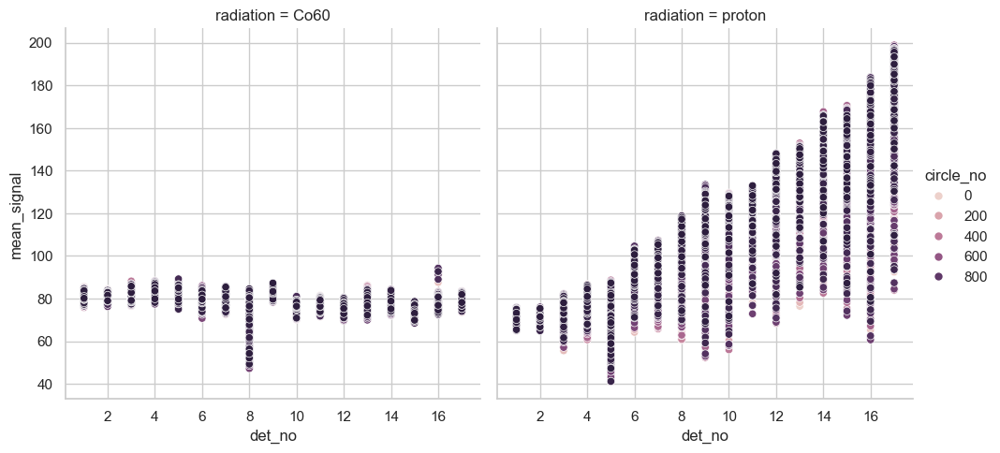

In [44]:
import seaborn as sns
sns.set_theme(style="whitegrid")
sns.relplot(x="det_no", y="mean_signal", hue="circle_no", col="radiation", data=df)

In [45]:
df2 = pd.DataFrame()
df2["mean"] = df.groupby(["radiation", "det_no"])["mean_signal"].mean()
df2["std"] = df.groupby(["radiation", "det_no"])["mean_signal"].std()
df2

mean        std
radiation det_no                       
Co60      1        81.205454   1.873170
          2        81.611696   1.234760
          3        82.490079   2.229555
          4        83.726520   2.417854
          5        82.164689   2.542740
          6        78.619051   2.257834
          7        79.692557   2.702632
          8        73.068703   9.998371
          9        82.579418   1.607045
          10       76.107739   1.894623
          11       76.536956   1.950267
          12       76.747347   1.940899
          13       78.274351   2.905702
          14       77.551568   2.444968
          15       74.437340   2.189473
          16       78.748348   2.921456
          17       78.599773   1.785468
proton    1        72.276431   2.025129
          2        71.770233   1.906493
          3        74.265594   4.210277
          4        80.166608   4.323314
          5        66.187989   9.028334
          6        92.690080   7.359619
          7        96.701272   8.018962
          8       105.813032  11.420628
          9       115.989550  16.063452
          10      116.911694  14.889479
          11      121.934511  11.044092
          12      131.316633  16.123715
          13      139.529757  14.929736
          14      148.368301  17.698476
          15      148.287345  20.582696
          16      154.245708  27.273083
          17      174.422883  24.544723

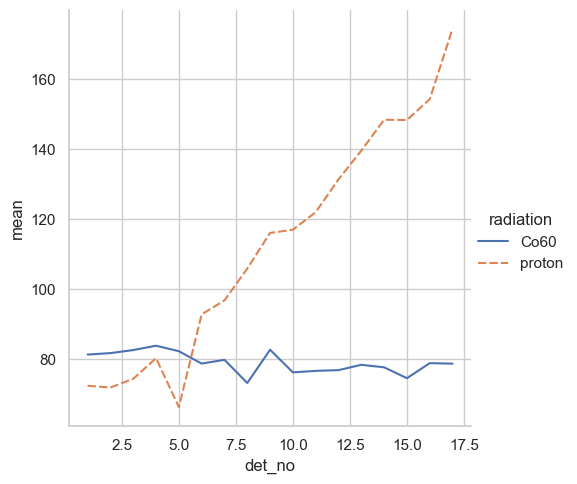

In [46]:
sns.relplot(data=df2.reset_index(), x='det_no', y='mean', hue='radiation', style='radiation', kind='line')

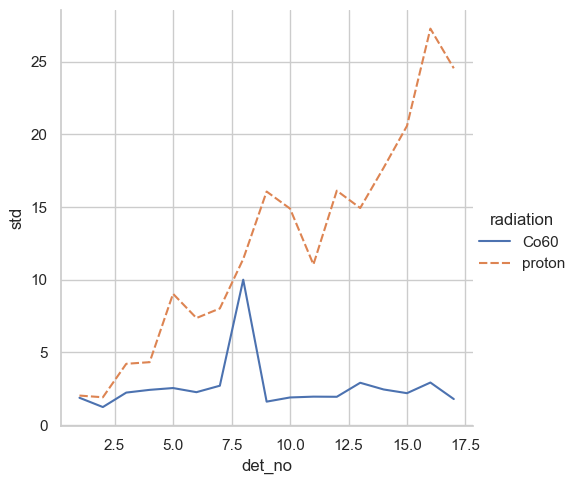

In [47]:
sns.relplot(data=df2.reset_index(), x='det_no', y='std', hue='radiation', style='radiation', kind='line')

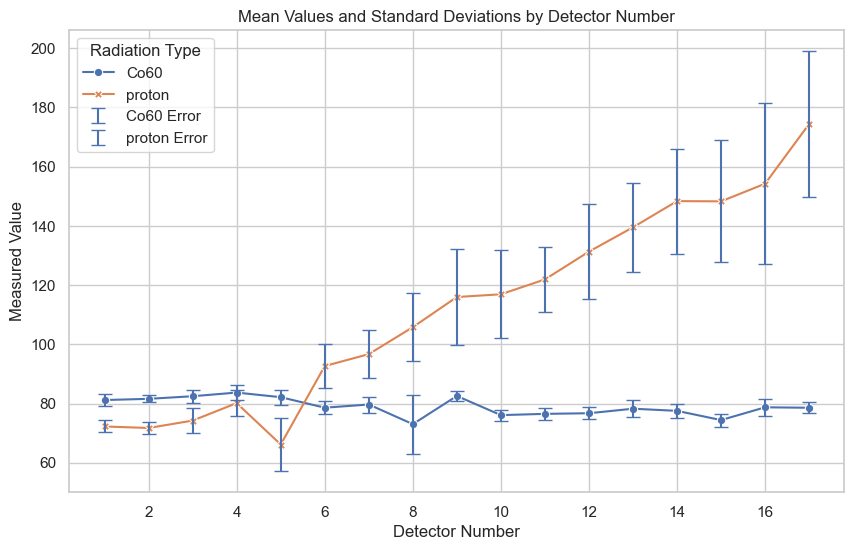

In [48]:
# Reset the index if df2 is a MultiIndex DataFrame
df2_reset = df2.reset_index()

# Create a figure and axis object
plt.figure(figsize=(10, 6))

# Plot the mean values with line and scatter points
sns.lineplot(data=df2_reset, x='det_no', y='mean', hue='radiation', style='radiation', markers=True, dashes=False)

# Add error bars
for radiation_type in df2_reset['radiation'].unique():
    subset = df2_reset[df2_reset['radiation'] == radiation_type]
    plt.errorbar(subset['det_no'], subset['mean'], yerr=subset['std'], fmt='none', capsize=5, label=f'{radiation_type} Error')

plt.title('Mean Values and Standard Deviations by Detector Number')
plt.xlabel('Detector Number')
plt.ylabel('Measured Value')
plt.legend(title='Radiation Type')

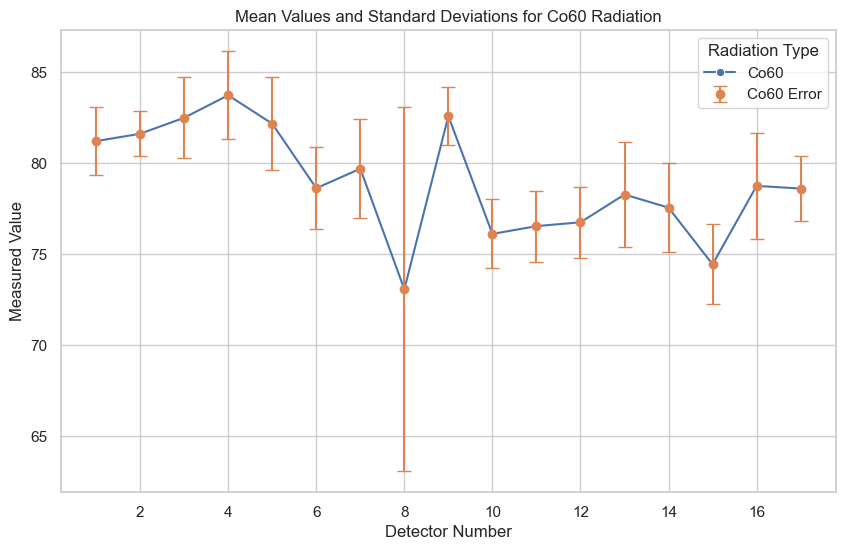

In [49]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df2 is already defined and includes 'mean' and 'std' columns for each 'det_no' for different 'radiation' conditions.

# Reset the index if df2 is a MultiIndex DataFrame
df2_reset = df2.reset_index()

# Filter the data for 'Co60' radiation
df2_co60 = df2_reset[df2_reset['radiation'] == 'Co60']

# Create a figure and axis object
plt.figure(figsize=(10, 6))

# Plot the mean values with line and scatter points for Co60
sns.lineplot(data=df2_co60, x='det_no', y='mean', hue='radiation', style='radiation', markers=True, dashes=False)

# Add error bars for Co60
plt.errorbar(df2_co60['det_no'], df2_co60['mean'], yerr=df2_co60['std'], fmt='o', capsize=5, label='Co60 Error')

plt.title('Mean Values and Standard Deviations for Co60 Radiation')
plt.xlabel('Detector Number')
plt.ylabel('Measured Value')
plt.legend(title='Radiation Type')

In [50]:
path_interim = base_path / '2024-04-22_PB_with_EBT_4Gy' / 'data' / 'interim'
path_interim.mkdir(parents=True, exist_ok=True)
df.to_hdf(path_interim / 'data.h5', key='df', mode='w')